# Estimating Hospitalization Risk

In [107]:
import pandas as pd 
import numpy as np 
from datetime import datetime
import seaborn as sns
import requests
from pprint import pprint
import copy
import plotly.express as px
import matplotlib.dates as mdates
fmt = mdates.DateFormatter('%d-%b\n%Y')  
import matplotlib.pyplot as plt

## Getting the data from FOPH
The URLs for downloading the data can be updated daily so that we can download the lates data.

In [2]:
context_url = "https://www.covid19.admin.ch/api/data/context"
context = requests.get(context_url).json()
pprint(context['sources']['individual']['csv']['daily'])

{'cases': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Cases_geoRegion.csv',
 'casesVaccPersons': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Cases_vaccpersons.csv',
 'covidCertificates': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Certificates.csv',
 'death': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Death_geoRegion.csv',
 'deathVaccPersons': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Death_vaccpersons.csv',
 'hosp': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Hosp_geoRegion.csv',
 'hospCapacity': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19HospCapacity_geoRegion.csv',
 'hospVaccPersons': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19Hosp_vaccpersons.csv',
 'intCases': 'https://www.covid19.admin.ch/api/data/20211124-nftko7tm/sources/COVID19IntCases.csv',
 're': 'ht

### Daily Hospitalizations by region

In [3]:
hurl = context['sources']['individual']['csv']['daily']['hosp']
print(f"Downloading from: {hurl}")
Hosp = pd.read_csv(hurl)
Hosp.tail(10)

,geoRegion,datum,entries,sumTotal,timeframe_7d,offset_last7d,sumTotal_last7d,timeframe_14d,offset_last14d,sumTotal_last14d,...,inzsum14d,sumdelta7d,inzdelta7d,type,type_variant,version,datum_unit,entries_letzter_stand,entries_neu_gemeldet,entries_diff_last
18550,ZH,2021-11-15,11,5402,False,5415,0,True,5357,45,...,5.41,8.0,0.51,COVID19Hosp,NaN,2021-11-24_07-51-48,day,11,0,16
18551,ZH,2021-11-16,13,5415,False,5415,0,True,5357,58,...,5.79,5.0,0.32,COVID19Hosp,NaN,2021-11-24_07-51-48,day,13,0,16
18552,ZH,2021-11-17,8,5423,True,5415,8,True,5357,66,...,6.18,2.0,0.13,COVID19Hosp,NaN,2021-11-24_07-51-48,day,8,0,16
18553,ZH,2021-11-18,13,5436,True,5415,21,True,5357,79,...,6.57,2.0,0.13,COVID19Hosp,NaN,2021-11-24_07-51-48,day,11,2,16
18554,ZH,2021-11-19,6,5442,True,5415,27,True,5357,85,...,6.57,0.0,0.00,COVID19Hosp,NaN,2021-11-24_07-51-48,day,3,3,16
18555,ZH,2021-11-20,7,5449,True,5415,34,True,5357,92,...,6.82,3.0,0.19,COVID19Hosp,NaN,2021-11-24_07-51-48,day,6,1,16
18556,ZH,2021-11-21,9,5458,True,5415,43,True,5357,101,...,7.21,2.0,0.13,COVID19Hosp,NaN,2021-11-24_07-51-48,day,7,2,16
18557,ZH,2021-11-22,10,5468,True,5415,53,True,5357,111,...,7.66,-1.0,-0.06,COVID19Hosp,NaN,2021-11-24_07-51-48,day,5,5,16
18558,ZH,2021-11-23,3,5471,True,5415,56,True,5357,114,...,7.34,-10.0,-0.65,COVID19Hosp,NaN,2021-11-24_07-51-48,day,0,3,16
18559,ZH,2021-11-24,0,5471,False,5415,0,False,5357,0,...,6.95,-8.0,-0.51,COVID19Hosp,NaN,2021-11-24_07-51-48,day,0,0,16


In [4]:
Hosp['date'] = pd.to_datetime(Hosp.datum)
Hosp.set_index('date', inplace=True)

### Daily Cases by region

In [5]:
curl = context['sources']['individual']['csv']['daily']['cases']
print(f"Downloading from: {curl}")
Cases = pd.read_csv(curl, parse_dates=True)
Cases

,geoRegion,datum,entries,sumTotal,timeframe_7d,offset_last7d,sumTotal_last7d,timeframe_14d,offset_last14d,sumTotal_last14d,...,inzsum14d,sumdelta7d,inzdelta7d,type,type_variant,version,datum_unit,entries_letzter_stand,entries_neu_gemeldet,entries_diff_last
0,CH,2020-02-24,1,1,False,927848,0,False,899173,0,...,NaN,NaN,NaN,COVID19Cases,NaN,2021-11-24_07-51-48,day,1,0,8549
1,CH,2020-02-25,1,2,False,927848,0,False,899173,0,...,NaN,NaN,NaN,COVID19Cases,NaN,2021-11-24_07-51-48,day,1,0,8549
2,CH,2020-02-26,10,12,False,927848,0,False,899173,0,...,NaN,NaN,NaN,COVID19Cases,NaN,2021-11-24_07-51-48,day,10,0,8549
3,CH,2020-02-27,10,22,False,927848,0,False,899173,0,...,NaN,NaN,NaN,COVID19Cases,NaN,2021-11-24_07-51-48,day,10,0,8549
4,CH,2020-02-28,10,32,False,927848,0,False,899173,0,...,NaN,NaN,NaN,COVID19Cases,NaN,2021-11-24_07-51-48,day,10,0,8549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18555,ZH,2021-11-20,705,158706,True,154850,3856,True,149935,8771,...,661.06,205.0,13.19,COVID19Cases,NaN,2021-11-24_07-51-48,day,639,66,1268
18556,ZH,2021-11-21,571,159277,True,154850,4427,True,149935,9342,...,681.98,154.0,9.92,COVID19Cases,NaN,2021-11-24_07-51-48,day,497,74,1268
18557,ZH,2021-11-22,1084,160361,True,154850,5511,True,149935,10426,...,713.13,198.0,12.74,COVID19Cases,NaN,2021-11-24_07-51-48,day,416,668,1268
18558,ZH,2021-11-23,469,160830,True,154850,5980,True,149935,10895,...,701.35,-475.0,-30.57,COVID19Cases,NaN,2021-11-24_07-51-48,day,0,469,1268


In [6]:
Cases['date'] = pd.to_datetime(Cases.datum)
Cases.set_index('date', inplace=True)

### Daily Hospitalizations of vaccinated persons

In [7]:
hvpurl = context['sources']['individual']['csv']['daily']['hospVaccPersons']
print(f"Downloading from: {hvpurl}")
Hosp_vp = pd.read_csv(hvpurl)
Hosp_vp

,date,vaccine,vaccination_status,entries,sumTotal,pop,inz_entries,inzsumTotal,mean7d,inzmean7d,prct,prctSumTotal,prct_mean7d,geoRegion,type,type_variant,data_completeness,version
0,2021-01-27,moderna,fully_vaccinated,0,0,125.0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,CHFL,COVID19Hosp,vaccine,limited,2021-11-24_07-51-48
1,2021-01-28,moderna,fully_vaccinated,0,0,176.0,0.00,NaN,NaN,NaN,0.00,0.00,NaN,CHFL,COVID19Hosp,vaccine,limited,2021-11-24_07-51-48
2,2021-01-29,moderna,fully_vaccinated,0,0,184.0,0.00,NaN,NaN,NaN,NaN,0.00,NaN,CHFL,COVID19Hosp,vaccine,limited,2021-11-24_07-51-48
3,2021-01-30,moderna,fully_vaccinated,0,0,184.0,0.00,NaN,0.0,0.0,0.00,0.00,NaN,CHFL,COVID19Hosp,vaccine,limited,2021-11-24_07-51-48
4,2021-01-31,moderna,fully_vaccinated,0,0,184.0,0.00,NaN,0.0,0.0,NaN,0.00,NaN,CHFL,COVID19Hosp,vaccine,limited,2021-11-24_07-51-48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3005,2021-11-22,all,unknown,5,4326,NaN,NaN,NaN,NaN,NaN,11.90,35.58,NaN,CHFL,COVID19Hosp,vaccine,intermediate,2021-11-24_07-51-48
3006,2021-11-23,all,fully_vaccinated,3,1207,5760534.0,0.05,NaN,NaN,NaN,27.27,9.92,NaN,CHFL,COVID19Hosp,vaccine,intermediate,2021-11-24_07-51-48
3007,2021-11-23,all,partially_vaccinated,0,235,155693.0,0.00,NaN,NaN,NaN,0.00,1.93,NaN,CHFL,COVID19Hosp,vaccine,intermediate,2021-11-24_07-51-48
3008,2021-11-23,all,not_vaccinated,6,6398,2793128.0,0.21,NaN,NaN,NaN,54.55,52.58,NaN,CHFL,COVID19Hosp,vaccine,intermediate,2021-11-24_07-51-48


In [8]:
Hosp_vp['date'] = pd.to_datetime(Hosp_vp.date)
Hosp_vp.set_index('date', inplace=True)

### Tests

In [57]:
testurl = context['sources']['individual']['csv']['daily']['test']
print(f"Downloading from: {testurl}")
Tests = pd.read_csv(testurl, low_memory=False)
Tests = Tests.convert_dtypes()
Tests

,datum,entries,entries_pos,entries_neg,sumTotal,timeframe_7d,sumTotal_last7d,timeframe_14d,sumTotal_last14d,timeframe_28d,...,inzsumTotal_Phase4,inzsum7d,inzsum14d,type,version,datum_unit,nachweismethode,geoRegion,entries_diff_last_age,entries_diff_last
0,2020-02-06,1,0,1,1,False,0,False,0,False,...,<NA>,<NA>,<NA>,COVID19Tests,2021-11-24_07-51-48,day,all,CHFL,1,56160
1,2020-02-12,1,0,1,2,False,0,False,0,False,...,<NA>,<NA>,<NA>,COVID19Tests,2021-11-24_07-51-48,day,all,CHFL,1,56160
2,2020-02-24,33,1,32,35,False,0,False,0,False,...,<NA>,<NA>,<NA>,COVID19Tests,2021-11-24_07-51-48,day,all,CHFL,1,56160
3,2020-02-25,159,0,159,194,False,0,False,0,False,...,<NA>,<NA>,<NA>,COVID19Tests,2021-11-24_07-51-48,day,all,CHFL,1,56160
4,2020-02-26,317,8,309,511,False,0,False,0,False,...,<NA>,<NA>,<NA>,COVID19Tests,2021-11-24_07-51-48,day,all,CHFL,1,56160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19425,2021-11-19,7606,1113,6493,2171257,True,23300,True,60654,True,...,43839.12,2720.89,4886.18,COVID19Tests,2021-11-24_07-51-48,day,all,ZH,1,8059
19426,2021-11-20,5375,828,4547,2176632,True,28675,True,66029,True,...,44185.13,2794.02,4999.28,COVID19Tests,2021-11-24_07-51-48,day,all,ZH,1,8059
19427,2021-11-21,2760,587,2173,2179392,True,31435,True,68789,True,...,44362.8,2806.64,5047.82,COVID19Tests,2021-11-24_07-51-48,day,all,ZH,1,8059
19428,2021-11-22,7194,1315,5879,2186586,True,38629,True,75983,True,...,44825.91,2909.25,5228.13,COVID19Tests,2021-11-24_07-51-48,day,all,ZH,1,8059


In [64]:
Tests['date'] = pd.to_datetime(Tests.datum)
Tests.set_index('date', inplace=True)

### Deaths

In [9]:
durl = context['sources']['individual']['csv']['daily']['death']
print(f"Downloading from: {durl}")
Death = pd.read_csv(durl)
Death

,geoRegion,datum,entries,sumTotal,timeframe_7d,offset_last7d,sumTotal_last7d,timeframe_14d,offset_last14d,sumTotal_last14d,...,inzsum14d,sumdelta7d,inzdelta7d,type,type_variant,version,datum_unit,entries_letzter_stand,entries_neu_gemeldet,entries_diff_last
0,CH,2020-02-24,0,0,False,10935,0,False,10884,0,...,NaN,NaN,NaN,COVID19Death,NaN,2021-11-24_07-51-48,day,0,0,17
1,CH,2020-02-25,0,0,False,10935,0,False,10884,0,...,NaN,NaN,NaN,COVID19Death,NaN,2021-11-24_07-51-48,day,0,0,17
2,CH,2020-02-26,0,0,False,10935,0,False,10884,0,...,NaN,NaN,NaN,COVID19Death,NaN,2021-11-24_07-51-48,day,0,0,17
3,CH,2020-02-27,0,0,False,10935,0,False,10884,0,...,NaN,NaN,NaN,COVID19Death,NaN,2021-11-24_07-51-48,day,0,0,17
4,CH,2020-02-28,0,0,False,10935,0,False,10884,0,...,NaN,NaN,NaN,COVID19Death,NaN,2021-11-24_07-51-48,day,0,0,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18555,ZH,2021-11-20,1,1496,True,1489,7,True,1480,16,...,1.42,-1.0,-0.06,COVID19Death,NaN,2021-11-24_07-51-48,day,1,0,4
18556,ZH,2021-11-21,3,1499,True,1489,10,True,1480,19,...,1.48,3.0,0.19,COVID19Death,NaN,2021-11-24_07-51-48,day,2,1,4
18557,ZH,2021-11-22,2,1501,True,1489,12,True,1480,21,...,1.48,1.0,0.07,COVID19Death,NaN,2021-11-24_07-51-48,day,1,1,4
18558,ZH,2021-11-23,1,1502,True,1489,13,True,1480,22,...,1.42,0.0,0.00,COVID19Death,NaN,2021-11-24_07-51-48,day,0,1,4


In [10]:
Death['date'] = pd.to_datetime(Death.datum)
Death.set_index('date', inplace=True)

### $R_e$

In [11]:
reurl = context['sources']['individual']['csv']['daily']['re']
print(f"Downloading from: {reurl}")
Re = pd.read_csv(reurl)
Re.dropna().tail(10)

,geoRegion,date,median_R_mean,median_R_highHPD,median_R_lowHPD,timeframe_14d,timeframe_28d,timeframe_phase2,timeframe_phase2b,timeframe_phase3,timeframe_phase4,timeframe_all,type,version,median_R_mean_mean7d
26829,ZH,2021-10-30,1.31,1.40,1.21,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.32
26830,ZH,2021-10-31,1.31,1.42,1.21,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.31
26831,ZH,2021-11-01,1.31,1.42,1.21,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.31
26832,ZH,2021-11-02,1.32,1.42,1.21,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.31
26833,ZH,2021-11-03,1.32,1.43,1.22,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.31
26834,ZH,2021-11-04,1.33,1.46,1.21,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.31
26835,ZH,2021-11-05,1.34,1.49,1.19,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.32
26836,ZH,2021-11-06,1.35,1.53,1.18,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.33
26837,ZH,2021-11-07,1.36,1.54,1.17,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.33
26838,ZH,2021-11-08,1.36,1.54,1.18,False,True,True,True,True,True,True,COVID19Re,2021-11-24_07-51-48,1.34


In [12]:
Re['date'] = pd.to_datetime(Re.date)
Re.set_index('date', inplace=True)

## Plotting the Series

### Hospitalizations

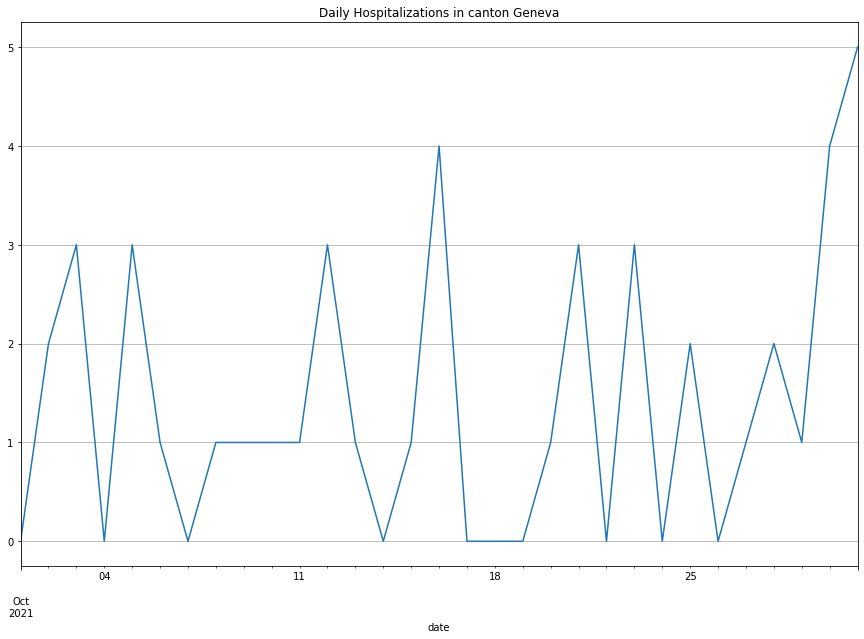

In [13]:
Hosp[Hosp.geoRegion=='GE'].loc['2021-10'].entries.plot(figsize=(15,10), grid=True);
plt.title('Daily Hospitalizations in canton Geneva');

### Cases

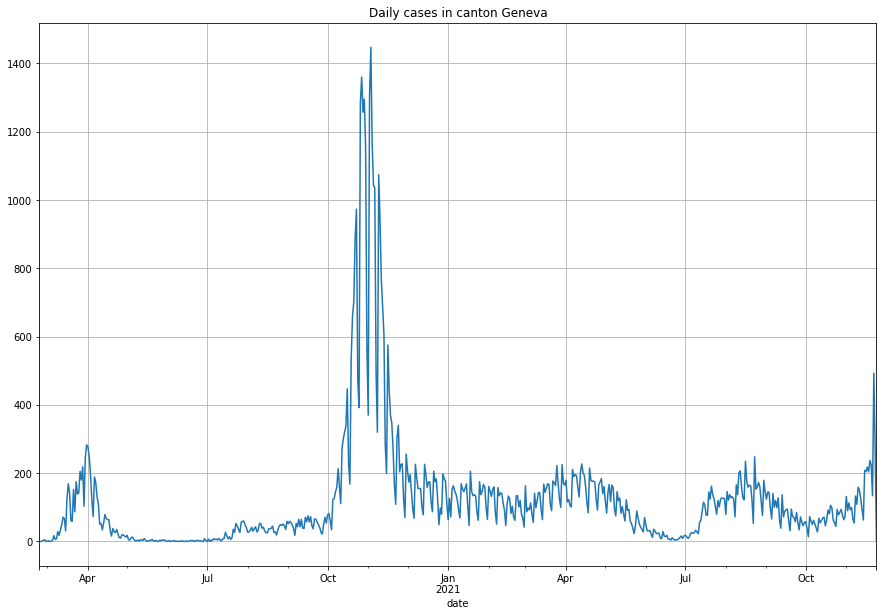

In [14]:
Cases[Cases.geoRegion=='GE'].entries.plot(figsize=(15,10), grid=True);
plt.title('Daily cases in canton Geneva');

### Hospitalization of Vaccinated persons

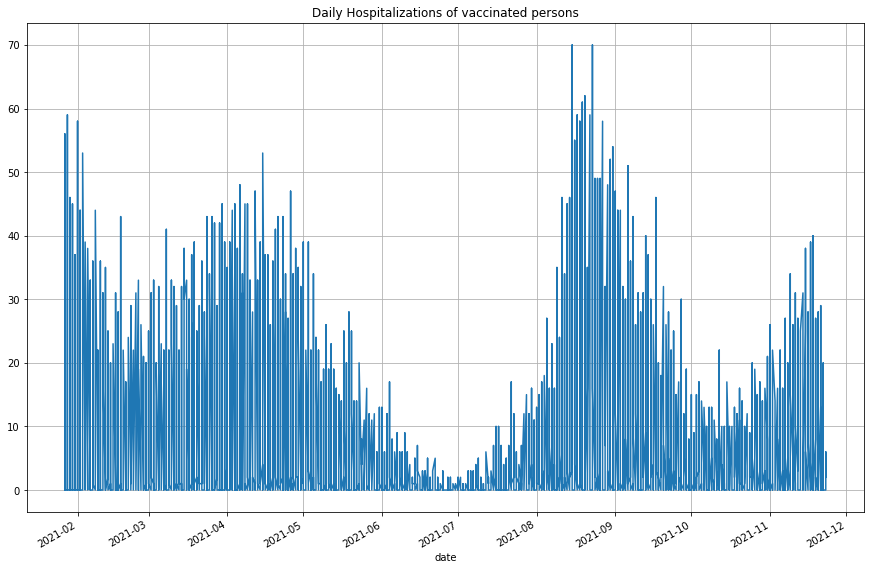

In [150]:
Hosp_vp.entries.plot(figsize=(15,10), grid=True)
plt.title('Daily Hospitalizations of vaccinated persons');

### Tests

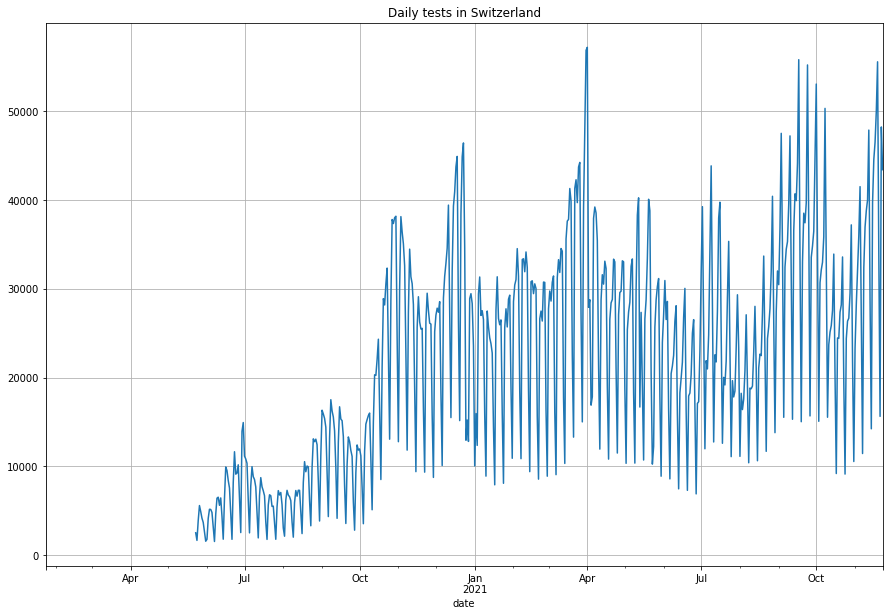

In [148]:
Tests[Tests.geoRegion=='CH'].entries.plot(figsize=(15,10), grid=True)
plt.title('Daily tests in Switzerland');

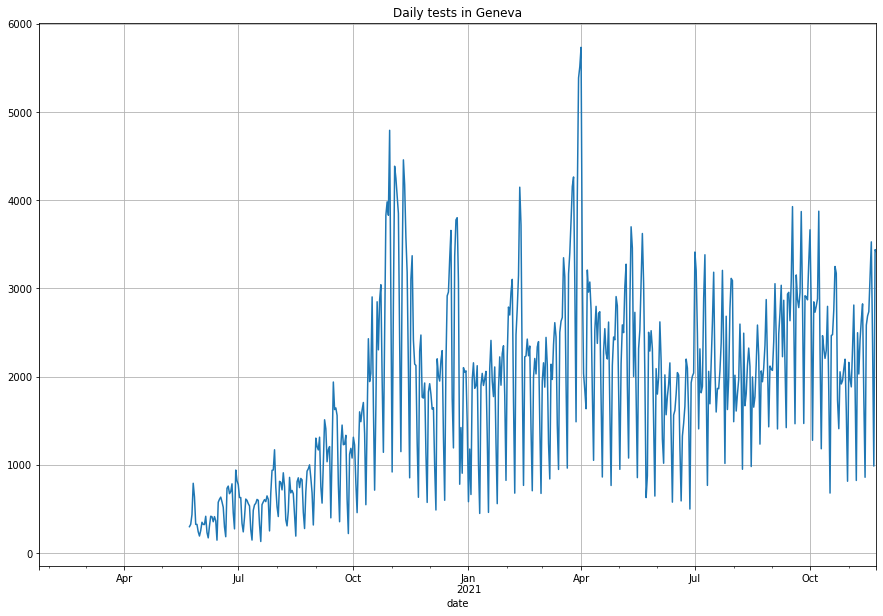

In [151]:
Tests[Tests.geoRegion=='GE'].entries.plot(figsize=(15,10), grid=True)
plt.title('Daily tests in Geneva');

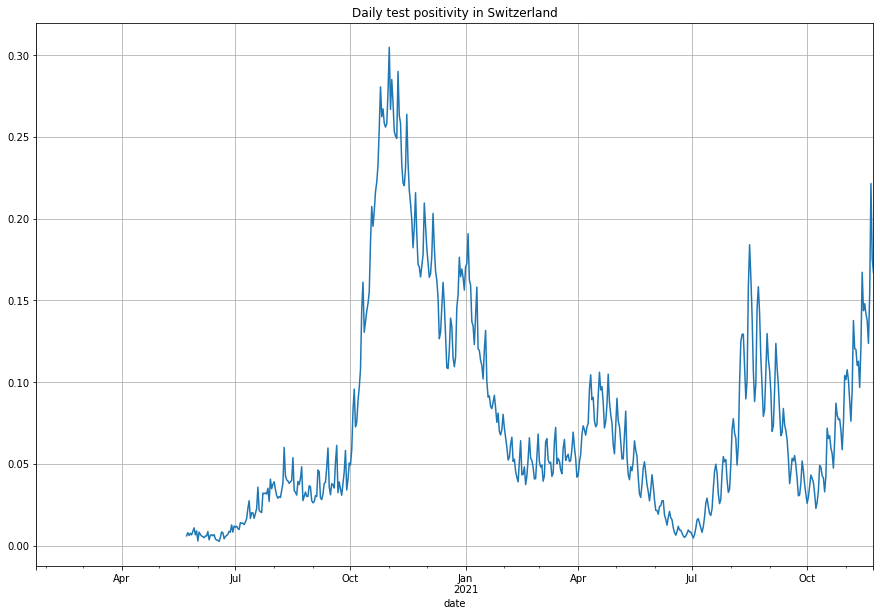

In [152]:
(Tests[Tests.geoRegion=='CH'].entries_pos/Tests[Tests.geoRegion=='CH'].entries).plot(figsize=(15,10), grid=True)
plt.title('Daily test positivity in Switzerland');

/tmp/ipykernel_3727408/1647788089.py:15: UserWarning:

FixedFormatter should only be used together with FixedLocator



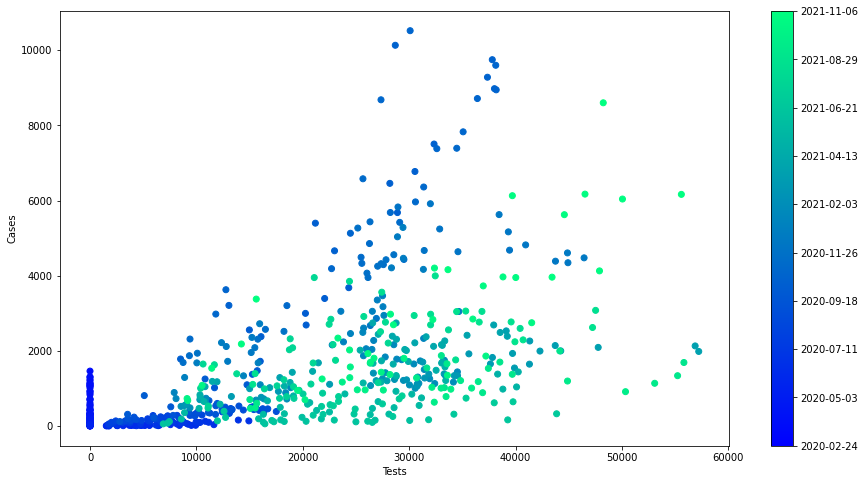

In [145]:
fig, ax = plt.subplots(1,1,figsize=(15, 8))
region = 'CH'
colors = np.linspace(0.1, 1, len(Cases[Cases.geoRegion==region])-1)
mymap = plt.get_cmap("winter")

x = Tests[Tests.geoRegion==region].loc['2020-02-24':'2021-11-23'].entries.fillna(0)
y=Cases[Cases.geoRegion==region].loc['2020-02-24':'2021-11-23'].entries
# print(x,y)
sc = ax.scatter(x, y, c=colors, cmap=mymap, lw=1)
# ax.xaxis.set_major_formatter(fmt)

plt.ylabel('Cases')
plt.xlabel('Tests')
cb = plt.colorbar(sc)
cb.ax.set_yticklabels([str(p.date()) for p in x[:: (len(x) // 10)+6].index]);

In [135]:
x=np.arange(500)
x[::13]

array([  0,  13,  26,  39,  52,  65,  78,  91, 104, 117, 130, 143, 156,
       169, 182, 195, 208, 221, 234, 247, 260, 273, 286, 299, 312, 325,
       338, 351, 364, 377, 390, 403, 416, 429, 442, 455, 468, 481, 494])

### Deaths

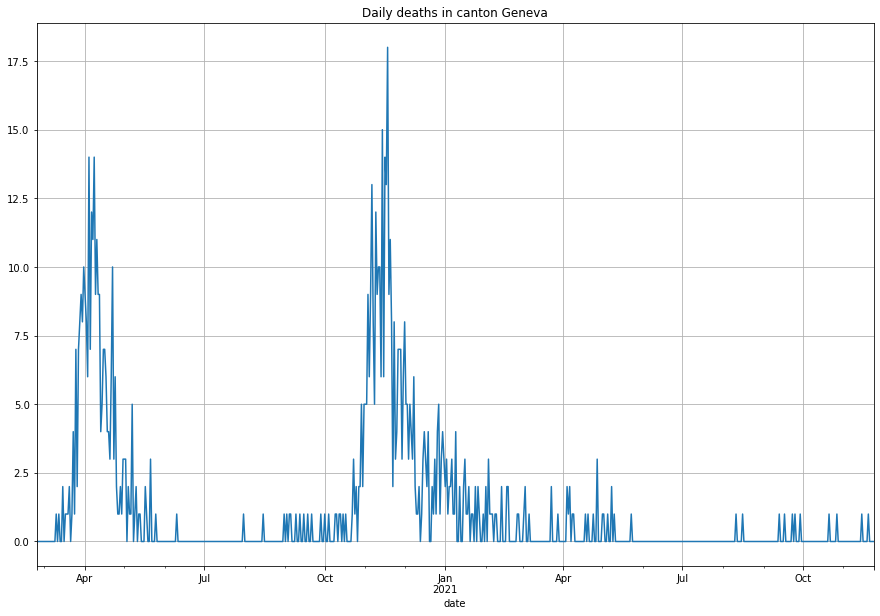

In [16]:
Death[Death.geoRegion=='GE'].entries.plot(figsize=(15,10), grid=True)
plt.title('Daily deaths in canton Geneva');

### Hospitalizations *vs* cases

/tmp/ipykernel_3727408/3654811325.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  cb.ax.set_yticklabels([str(p.date()) for p in Hosp[:: len(Hosp) // 10].index]);


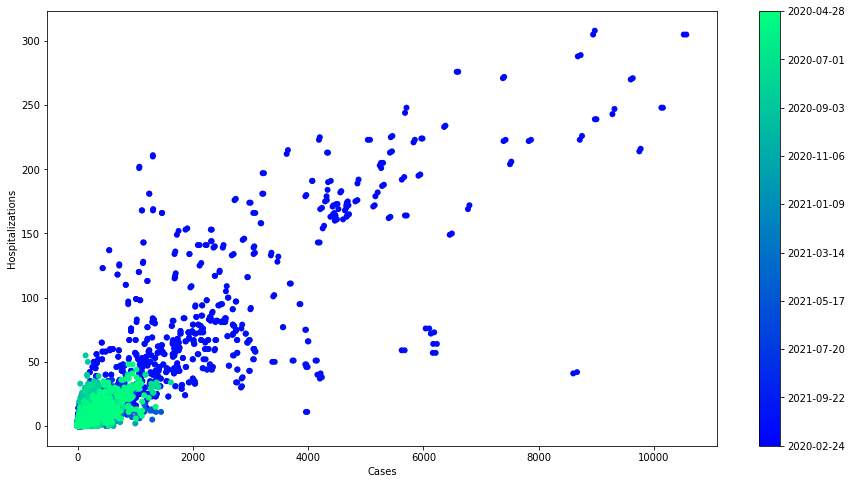

In [17]:
fig, ax = plt.subplots(1,1,figsize=(15, 8))
colors = np.linspace(0.1, 1, len(Hosp))
mymap = plt.get_cmap("winter")
sc = ax.scatter(Cases.entries, Hosp.entries, c=colors, cmap=mymap, lw=0)
plt.ylabel('Hospitalizations')
plt.xlabel('Cases')
cb = plt.colorbar(sc)
cb.ax.set_yticklabels([str(p.date()) for p in Hosp[:: len(Hosp) // 10].index]);

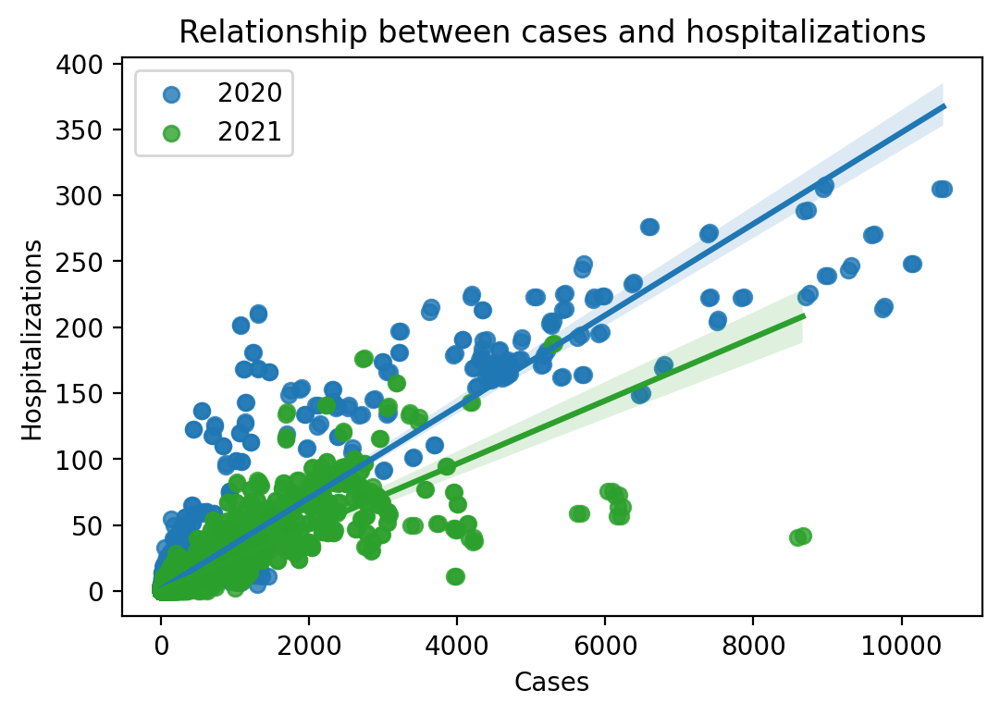

In [18]:
fig, ax = plt.subplots(dpi = 200)
sns.regplot(x=Cases[:'2020-12-31'].entries, y=Hosp[:'2020-12-31'].entries,  label = '2020', color = 'tab:blue', ax=ax )

sns.regplot(x=Cases['2021-01-01':].entries,y=Hosp['2021-01-01':].entries,  label = '2021', color = 'tab:green', ax=ax )


ax.set_ylabel('Hospitalizations')
ax.set_xlabel('Cases')

ax.set_title('Relationship between cases and hospitalizations')

ax.legend();
# plt.show()

## Cross-Correlation analysis
Here we will look at the maximum cross-correlation lag between cantons as a proxy of the direction of predictability, i.e. cantos that anticipate another in the incidence movements can be good predictors for the latter. 

In [19]:
def get_lag(x,y,maxlags=5, smooth=True):
    if smooth:
        x = pd.Series(x).rolling(7).mean().dropna().values
        y = pd.Series(y).rolling(7).mean().dropna().values
    corr = np.correlate(x,y, mode='full')/np.sqrt(np.dot(x,x)*np.dot(y,y))
    slice = np.s_[(len(corr)-maxlags)//2:-(len(corr)-maxlags)//2]
    corr = corr[slice]
    lag = np.argmax(corr)-(len(corr)//2-1)

    return lag, corr.max()

def lag_ccf(a,maxlags=30,smooth=True):
    """
    Calculate the full correlation matrix based on the maximum correlation lag 
    """
    ncols = a.shape[1]
    lags = np.zeros((ncols,ncols))
    cmat = np.zeros((ncols,ncols))
    for i in range(ncols): 
        for j in range(ncols):
#             if j>i:
#                 continue
            lag, corr = get_lag(a.T[i],a.T[j], maxlags, smooth)
            cmat[i,j] = corr
            lags[i,j] = lag
    return cmat,lags

### Preparing the data
First we have to send prepare a data frame with the incidence series by canton on the columns. We will exclude `CHFL` and `CH`.

In [20]:
inc_canton = Cases.pivot(columns='geoRegion', values='entries')
del inc_canton['CHFL']
del inc_canton['CH']
# inc_canton.plot(figsize=(15,10));
px.line(inc_canton)

In [21]:
cm,lm=lag_ccf(inc_canton.values)

### Calculating the cross-correlations

Looking at the cross correlation plot for cantons `BL` and `GE`. If we zoom around the 0 lag we see that the maximum correlation is not on 0:

In [22]:
# Applying a 7-day rolling mean to avoid weekend noise when estimating the lag between series
x=inc_canton.BL.rolling(7).mean().dropna()
y=inc_canton.GE.rolling(7).mean().dropna()
corr = np.correlate(x,y, mode='full')/np.sqrt(np.dot(x,x)*np.dot(y,y))
lag = np.argmax(corr)-((len(corr)//2)-1)
fig = px.line(x=np.arange(-len(x),len(x)-1), y=corr,
              
             )
fig.update_layout(xaxis_title='lag(days)',
                  yaxis_title='Cross-correlation',
                  title = f'Cross-correlation function between cantons BL and GE. Lag: {lag} days.'
)
fig.add_shape(type='line',
                yref="y",
                xref="x",
                x0=lag,
                y0=0,
                x1=lag,
                y1=corr.max()*1.05,
                line=dict(color='black', width=1))
fig.add_annotation(
                x=lag,
                y=1.06,
                yref='paper',
                showarrow=False,
                text='Max correlation')
fig.show()

In [23]:
fig = px.imshow(cm,
          labels=dict(x="Cantons", y="Cantons", color="Correlation"),
          x=inc_canton.columns,
          y=inc_canton.columns,
            title='Cross-correlation Matrix'
         )

fig.show()

In [24]:
fig = px.imshow(lm,
          labels=dict(x="Cantons", y="Cantons", color="Lag"),
          x=inc_canton.columns,
          y=inc_canton.columns,
            title='Highest correlation lag'
         )

fig.show()

### Clustering the Series based on correlation

In [25]:
import scipy.cluster.hierarchy as hcluster


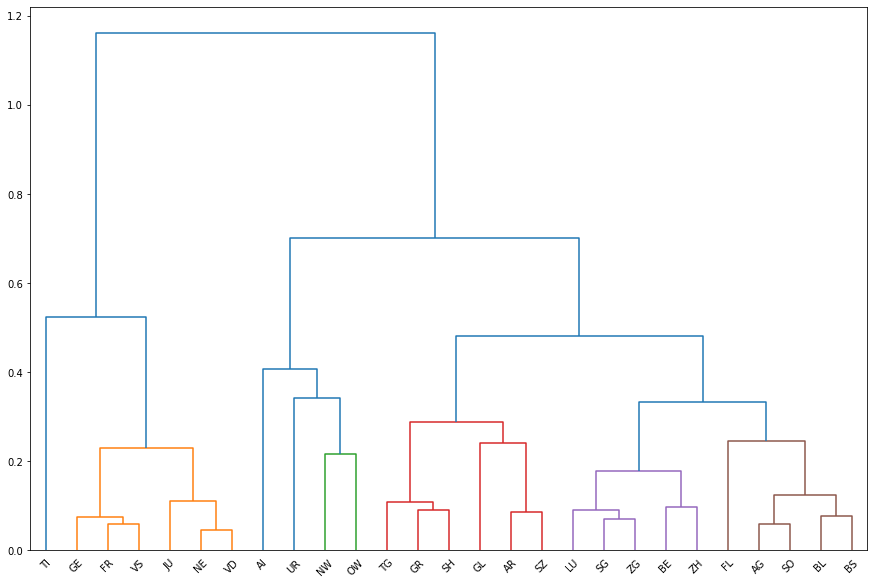

In [26]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
linkage = hcluster.linkage(cm, method='complete')
dendro  = hcluster.dendrogram(linkage, labels=inc_canton.columns, color_threshold=0.3, ax=ax)

### Network analysis
We can take the correlation matrix and build a network to represent the association between the cantons. for this network we will filter only correlations greater than $0.7$. We will use the correlation as the weight of each edge.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
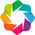

In [27]:
import holoviews as hv
from holoviews.operation.datashader import datashade, bundle_graph
import networkx as nx
from networkx.algorithms import community
hv.extension('bokeh')

defaults = dict(width=400, height=400)
hv.opts.defaults(
    hv.opts.EdgePaths(**defaults), hv.opts.Graph(**defaults), hv.opts.Nodes(**defaults))

In [28]:
adj = copy.deepcopy(cm)
adj[adj<0.7]=0
G = nx.from_numpy_matrix(adj, parallel_edges=False, create_using=nx.MultiDiGraph)
# Relabel nodes
G = nx.relabel_nodes(G, {n: f"{i}" for n,i in enumerate(inc_canton.columns)})
G['AG']['GE']

AtlasView({0: {'weight': 0.7747084779958037}})

In [29]:
def plot_network(G):
    colors = ['#000000']+hv.Cycle('Category20').values
    graph = hv.Graph.from_networkx(G, nx.layout.kamada_kawai_layout, 
                                   weight='weight').opts(tools=['hover'],
                                                         cmap=colors,
                                                         node_size=20,
                                                         node_line_color='gray'
                                                        )
    labels = hv.Labels(graph.nodes, ['x', 'y'], 'index')
    bg = bundle_graph(graph)
    return bg*labels.opts(text_font_size='8pt', text_color='white')
plot_network(G)

:Overlay
   .Graph.I  :Graph   [start,end]
   .Labels.I :Labels   [x,y]   (index)

#### Community detection
The greedy moodularity algorithm detects two communities

In [30]:
comms = list(community.greedy_modularity_communities(G, weight='weight'))
for c in comms:
    print(c)

frozenset({'GR', 'OW', 'TG', 'AR', 'SG', 'NW', 'LU', 'BS', 'GL', 'SZ', 'SO', 'SH', 'AG', 'ZG', 'BL', 'UR', 'AI'})
frozenset({'ZH', 'TI', 'VD', 'JU', 'VS', 'FR', 'GE', 'BE', 'NE'})
frozenset({'FL'})


In [31]:
plot_network(G.subgraph(comms[0]))

:Overlay
   .Graph.I  :Graph   [start,end]
   .Labels.I :Labels   [x,y]   (index)

In [32]:
plot_network(G.subgraph(comms[1]))

:Overlay
   .Graph.I  :Graph   [start,end]
   .Labels.I :Labels   [x,y]   (index)

## Bayesian Inference

In [33]:
import arviz as az
import numpy as np
import pymc3 as pm
import os

In [34]:
Cases21 = Cases['2021-01-01':]
Cases21GE = Cases21[Cases21.geoRegion=='GE']
Cases21GE

,geoRegion,datum,entries,sumTotal,timeframe_7d,offset_last7d,sumTotal_last7d,timeframe_14d,offset_last14d,sumTotal_last14d,...,inzsum14d,sumdelta7d,inzdelta7d,type,type_variant,version,datum_unit,entries_letzter_stand,entries_neu_gemeldet,entries_diff_last
date,,,,,,,,,,,,,,,,,,,,,
2021-01-01,GE,2021-01-01,64,44036,False,76707,0,False,75703,0,...,365.36,15.0,2.97,COVID19Cases,NaN,2021-11-24_07-51-48,day,64,0,440
2021-01-02,GE,2021-01-02,126,44162,False,76707,0,False,75703,0,...,367.54,28.0,5.52,COVID19Cases,NaN,2021-11-24_07-51-48,day,126,0,440
2021-01-03,GE,2021-01-03,72,44234,False,76707,0,False,75703,0,...,364.58,-8.0,-1.58,COVID19Cases,NaN,2021-11-24_07-51-48,day,72,0,440
2021-01-04,GE,2021-01-04,153,44387,False,76707,0,False,75703,0,...,354.11,-44.0,-8.68,COVID19Cases,NaN,2021-11-24_07-51-48,day,153,0,440
2021-01-05,GE,2021-01-05,163,44550,False,76707,0,False,75703,0,...,351.74,-21.0,-4.15,COVID19Cases,NaN,2021-11-24_07-51-48,day,163,0,440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-20,GE,2021-11-20,225,77591,True,76707,884,True,75703,1888,...,431.33,131.0,25.87,COVID19Cases,NaN,2021-11-24_07-51-48,day,225,0,440
2021-11-21,GE,2021-11-21,134,77725,True,76707,1018,True,75703,2022,...,447.13,71.0,14.02,COVID19Cases,NaN,2021-11-24_07-51-48,day,133,1,440
2021-11-22,GE,2021-11-22,493,78218,True,76707,1511,True,75703,2515,...,518.23,285.0,56.29,COVID19Cases,NaN,2021-11-24_07-51-48,day,325,168,440


In [35]:
Hosp21 = Hosp['2021-01-01':]
Hosp21GE = Hosp21[Hosp21.geoRegion=='GE']
Hosp21GE

,geoRegion,datum,entries,sumTotal,timeframe_7d,offset_last7d,sumTotal_last7d,timeframe_14d,offset_last14d,sumTotal_last14d,...,inzsum14d,sumdelta7d,inzdelta7d,type,type_variant,version,datum_unit,entries_letzter_stand,entries_neu_gemeldet,entries_diff_last
date,,,,,,,,,,,,,,,,,,,,,
2021-01-01,GE,2021-01-01,6,1022,False,2019,0,False,2017,0,...,10.66,1.0,0.20,COVID19Hosp,NaN,2021-11-24_07-51-48,day,6,0,0
2021-01-02,GE,2021-01-02,4,1026,False,2019,0,False,2017,0,...,11.06,3.0,0.59,COVID19Hosp,NaN,2021-11-24_07-51-48,day,4,0,0
2021-01-03,GE,2021-01-03,5,1031,False,2019,0,False,2017,0,...,11.45,1.0,0.20,COVID19Hosp,NaN,2021-11-24_07-51-48,day,5,0,0
2021-01-04,GE,2021-01-04,5,1036,False,2019,0,False,2017,0,...,11.85,-1.0,-0.20,COVID19Hosp,NaN,2021-11-24_07-51-48,day,5,0,0
2021-01-05,GE,2021-01-05,2,1038,False,2019,0,False,2017,0,...,11.85,-2.0,-0.40,COVID19Hosp,NaN,2021-11-24_07-51-48,day,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-20,GE,2021-11-20,0,2020,True,2019,1,True,2017,3,...,0.79,0.0,0.00,COVID19Hosp,NaN,2021-11-24_07-51-48,day,0,0,0
2021-11-21,GE,2021-11-21,1,2021,True,2019,2,True,2017,4,...,0.79,1.0,0.19,COVID19Hosp,NaN,2021-11-24_07-51-48,day,1,0,0
2021-11-22,GE,2021-11-22,0,2021,True,2019,2,True,2017,4,...,0.79,0.0,0.00,COVID19Hosp,NaN,2021-11-24_07-51-48,day,0,0,0


### Binomial process with variable rate

In [36]:
with pm.Model() as var_bin:

    # Priors for pre- and post-switch rates number of disasters
    
    probs = pm.Beta("P1", .5,.5, shape=len(Cases21GE))
    
    ratios = pm.Binomial("Ratios", n=Cases21GE.entries.values, p=probs, observed=Hosp21GE.entries.values)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [P1]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 8 seconds.


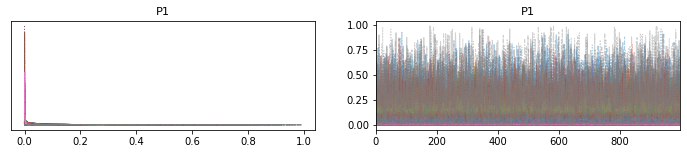

In [37]:
with var_bin:
    tracevb = pm.sample(1000, return_inferencedata=True)
    axes_arr = az.plot_trace(tracevb)

In [38]:
# az.plot_forest(tracevb);

In [39]:
P1_post = {'median': tracevb.posterior.P1.median(axis=(0,1)),
           'lower': np.percentile(tracevb.posterior.P1, 2.5, axis=(0,1)),
           'upper': np.percentile(tracevb.posterior.P1,97.5, axis=(0,1))
          }
px.line(pd.DataFrame(index=Cases21GE.index, data=P1_post))

### Roling regression
 Specifically, we will assume that intercept$=0$ and slope follows a random-walk through time. 
$$\beta_t \sim {\cal N}(\beta_{t-1},\sigma_{\beta}^2)$$


In [40]:
rolling_risks = pm.Model()
#Z-scoring the data
hosp_z = (Hosp21GE.entries- Hosp21GE.entries.mean())/Hosp21GE.entries.std()
cases_z = (Cases21GE.entries- Cases21GE.entries.mean())/Cases21GE.entries.std()
lag = 0
with rolling_risks:
    # std of random walk
#     sigma_alpha = pm.Exponential("sigma_alpha", .01)
    sigma_beta = pm.Exponential("sigma_beta", 1)

#     alpha = pm.GaussianRandomWalk("alpha", sigma=sigma_alpha, shape=len(cases_z))
    beta = pm.GaussianRandomWalk("beta", sigma=sigma_beta, shape=len(cases_z)-lag)
    # Define regression
    regression =  beta * cases_z.shift(lag).dropna() # No intercept because at zero cases we should have 0 hospitalizations

    # Assume cases are Normally distributed, the mean comes from the regression.
    sd = pm.HalfNormal("sd", sigma=0.5)
    likelihood = pm.Normal("y", mu=regression, sigma=sd, observed=hosp_z.iloc[lag:])
#     likelihood = pm.Poisson("y", mu=regression, observed=hosp_z.iloc[lag:])

In [41]:
with rolling_risks:
    trace_rw = pm.sample(1000,tune=3000,target_accept=0.9,return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sd, beta, sigma_beta]


Sampling 4 chains for 3_000 tune and 1_000 draw iterations (12_000 + 4_000 draws total) took 214 seconds.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


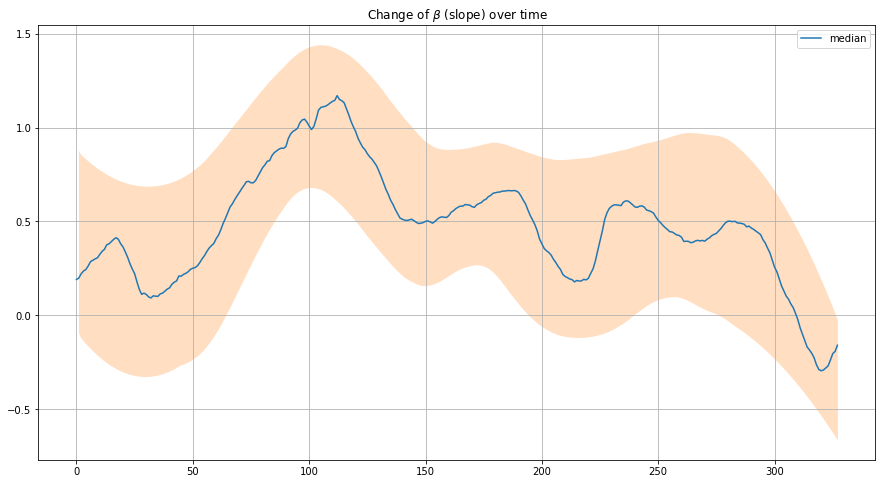

In [42]:
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
az.plot_hdi(
    x=range(len(cases_z)-lag),
    y=trace_rw.posterior.beta,
    hdi_prob=0.95,
    fill_kwargs={"alpha": 0.25, "linewidth": 0},
    ax=ax,
    color="C1",
);
ax.plot(range(len(cases_z)-lag),trace_rw.posterior.beta.median(axis=1).median(axis=0), label='median')
ax.grid()
ax.legend()
ax.set_title(r"Change of $\beta$ (slope) over time");
# ax[0].set_xticklabels([str(p.date()) for p in cases_z.index[:: len(cases_z)//len(ax[0].get_xticklabels())]]);#len(ax[0].get_xticklabels())

## Forecasting

In [232]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import itertools
import matplotlib.dates as mdates
fmt = mdates.DateFormatter('%d-%b\n%Y')  

In [233]:
# X = pd.concat([Cases[Cases.geoRegion=='GE'].entries,Hosp[Hosp.geoRegion=='GE'].entries], axis=1)
# X.columns = ['cases', 'hospitalizations']
X= inc_canton
# X = Cases[Cases.geoRegion=='GE'].entries
X = X.sort_index()
y = Hosp[Hosp.geoRegion=='GE'].entries
X = X.dropna() 
y = y.loc[X.index]# Align case and hospitalization series 
# print(X.index)
# print(y.index)

horizon = 7
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=horizon,shuffle=False)
X_train

geoRegion,AG,AI,AR,BE,BL,BS,FL,FR,GE,GL,...,SH,SO,SZ,TG,TI,UR,VD,VS,ZG,ZH
date,,,,,,,,,,,,,,,,,,,,,
2020-02-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2020-02-25,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-02-26,0,0,0,0,1,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
2020-02-27,0,0,0,1,0,0,0,0,3,0,...,0,0,0,0,3,0,0,0,0,1
2020-02-28,0,0,0,0,2,2,0,0,5,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-12,313,24,66,556,135,96,23,117,125,19,...,46,121,168,208,54,30,164,131,73,753
2021-11-13,190,10,19,332,99,55,16,115,94,8,...,24,57,100,157,38,25,117,78,65,500
2021-11-14,151,1,18,320,83,60,38,62,63,11,...,42,66,72,94,21,18,124,52,42,417


In [234]:
def build_lagged_features(dt, maxlag=2, dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    :param dt: Dataframe containing features
    :param maxlag: maximum lags to compute
    :param dropna: if true the initial rows containing NANs due to lagging will be dropped
    :return: Dataframe
    '''
    if type(dt) is pd.DataFrame:
        new_dict = {}
        for col_name in dt:
            new_dict[col_name] = dt[col_name]
            # create lagged Series
            for l in range(1, maxlag + 1):
                new_dict['%s_lag%d' % (col_name, l)] = dt[col_name].shift(l)
        res = pd.DataFrame(new_dict, index=dt.index)

    elif type(dt) is pd.Series:
        the_range = range(maxlag + 1)
        res = pd.concat([dt.shift(i) for i in the_range], axis=1)
        res.columns = ['lag_%d' % i for i in the_range]
    else:
        print('Only works for DataFrame or Series')
        return None
    if dropna:
        return res.dropna()
    else:
        return res

In [235]:
def rolling_predictions(df_train, target, horizon_forecast = 7, maxlag=10, n_neighbours=3):
    '''Train multiple models. One for each prediction delta
    :param df_train: training dataframe 
    :param horizon_forecast: Horizon (maximum forecast range)
    :param maxlag: number of past days to consider
    :param neighbours: knn parameter
    :return: Prediction'''
    df_lag = build_lagged_features(copy.deepcopy(df_train), maxlag=maxlag )
    df_lag = df_lag.dropna()
#     df_lag_test = build_lagged_features(copy.deepcopy(df_test), maxlag=maxlag )
#     df_lag_test = df_lag_test.dropna()
    
    # predictions
    preds = []

    for T in np.arange(1,horizon_forecast+1,1):
        if T == 1:
            fit_target = target.shift(-(T - 1))
        else:
            fit_target = target.shift(-(T - 1))[:-(T - 1)]
        fit_target = fit_target.iloc[:len(df_lag)]
#         print(T, len(df_lag), len(fit_target))
#         print(df_lag.index,fit_target.index)
        
        model = KNeighborsRegressor(n_neighbors=n_neighbours, weights='uniform')
        model.fit(df_lag,fit_target)
        pred = model.predict(df_lag.iloc[-1:])

        preds.append(pred)
    preds = np.array(preds)
#     print(preds.shape, preds)
        
    return preds
maxlag=14
fit_in = rolling_predictions(X_train.iloc[:-horizon], y_train.iloc[:-horizon], horizon, maxlag)
preds_in = rolling_predictions(X_train, y_train, horizon, maxlag)
preds_out = rolling_predictions(X,y, horizon,maxlag)

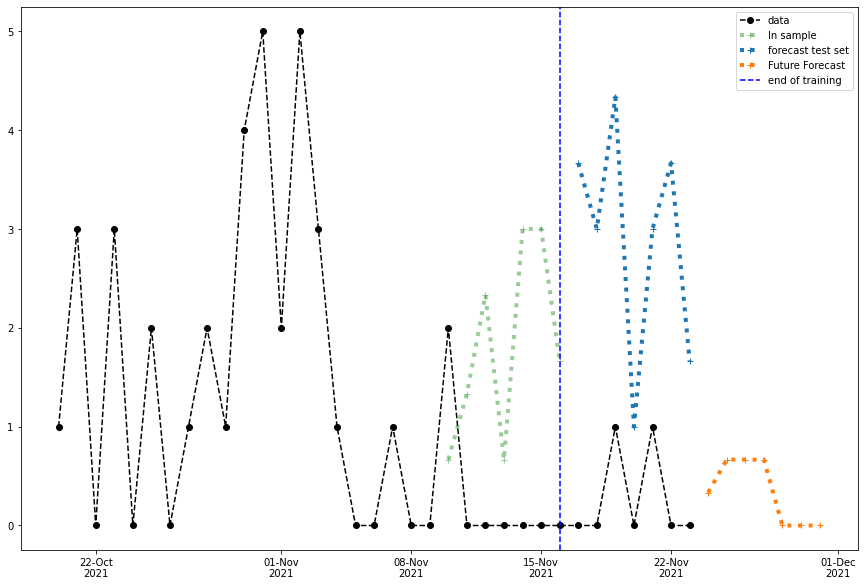

In [236]:
fig, ax = plt.subplots(figsize = (15,10))


ax.plot(y[-horizon*5:],'k--o', label = 'data')
ax.plot(y_train.index[-horizon:], fit_in, 'g:+', lw=4, alpha=0.4, label='In sample')
ax.plot(y_test.index[-horizon:], preds_in,':+', lw=4, label = 'forecast test set')
ax.plot(y_test.index[-horizon:].shift(horizon, freq='D'), preds_out,':+', lw=4, label = 'Future Forecast')

ax.axvline(x = np.array(y.index[-horizon-1:])[0], color = 'b', ls = '--', label = 'end of training')

ax.xaxis.set_major_formatter(fmt)

ax.legend()

plt.show()

### Lightgm model

In [237]:
import lightgbm as lgb

In [238]:
def rolling_predictions_model(df_train, target, model, horizon_forecast = 7, maxlag=10,):
    '''Train multiple models. One for each prediction delta
    :params df_train: training dataframe 
    :params horizon_forecast: Horizon (maximum forecast range)
    :params model: model to be fit
    :return: Predições'''
    df_lag = build_lagged_features(copy.deepcopy(df_train), maxlag=maxlag )
    df_lag = df_lag.dropna()
#     df_lag_test = build_lagged_features(copy.deepcopy(df_test), maxlag=maxlag )
#     df_lag_test = df_lag_test.dropna()
    
    # predictions
    preds = []

    for T in np.arange(1,horizon_forecast+1,1):
        if T == 1:
            fit_target = target.shift(-(T - 1))
        else:
            fit_target = target.shift(-(T - 1))[:-(T - 1)]
        fit_target = fit_target.iloc[:len(df_lag)]
#         print(T, len(df_lag), len(fit_target))
#         print(df_lag.index,fit_target.index)
        
        model.fit(df_lag,fit_target)
        pred = model.predict(df_lag.iloc[-1:])

        preds.append(pred)
    preds = np.array(preds)
#     print(preds.shape, preds)
        
    return preds


def build_model(params=None, **kwargs):
    '''
    Return an LGBM model
    :param kwargs:
    :return: LGBMRegressor model
    '''
    if params is None:
        params = {
            'n_jobs': 8,
            'max_depth': 4,
            'max_bin': 63,
            'num_leaves': 255,
#             'min_data_in_leaf': 1,
            'subsample': 0.9,
            'n_estimators': 200,
            'learning_rate': 0.1,
            'colsample_bytree': 0.9,
            'boosting_type': 'gbdt'
        }

    model = lgb.LGBMRegressor(objective='regression', **params)

    return model    

lgbm_model = build_model()

fit_in_lgbm = rolling_predictions(X_train.iloc[:-horizon], y_train.iloc[:-horizon], horizon, maxlag)
preds_in_lgbm = rolling_predictions_model(X_train, y_train, lgbm_model, horizon)
preds_out_lgbm = rolling_predictions_model(X,y, lgbm_model, horizon)


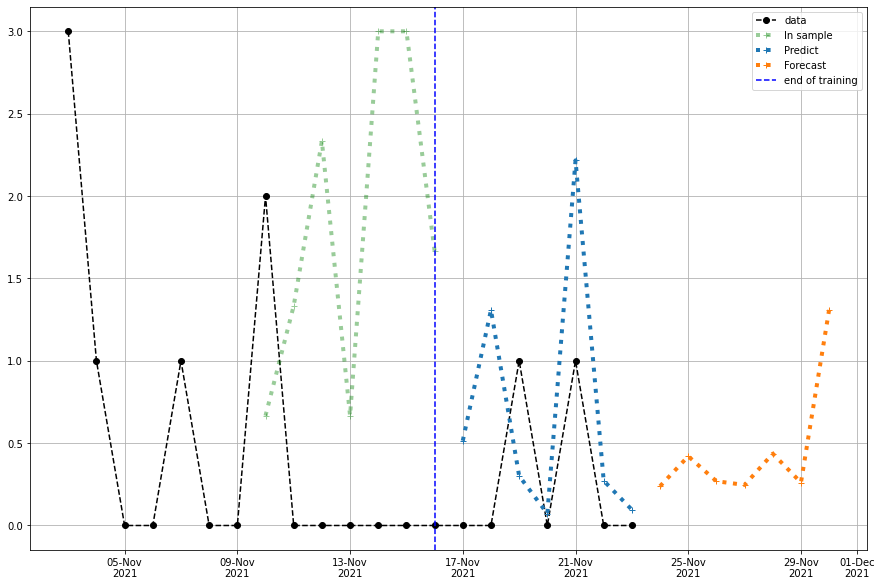

In [239]:
fig, ax = plt.subplots(figsize = (15,10))
ax.plot(y[-horizon*3:],'k--o', label = 'data')
ax.plot(y_train.index[-horizon:], fit_in_lgbm, 'g:+', lw=4, alpha=0.4, label='In sample')
ax.plot(y_test.index[-horizon:], preds_in_lgbm,':+', lw=4, label = 'Predict')
ax.plot(y_test.index[-horizon:].shift(horizon, freq='D'), preds_out_lgbm,':+', lw=4, label = 'Forecast')

ax.axvline(x = np.array(y.index[-horizon-1:])[0], color = 'b', ls = '--', label = 'end of training')

ax.xaxis.set_major_formatter(fmt)

ax.legend()
plt.grid()
plt.show()

In [240]:
for n, imp in zip(lgbm_model.feature_name_, lgbm_model.feature_importances_):
    print(n, imp)

AG 3
AG_lag1 3
AG_lag2 1
AG_lag3 0
AG_lag4 8
AG_lag5 3
AG_lag6 0
AG_lag7 4
AG_lag8 7
AG_lag9 5
AG_lag10 4
AI 2
AI_lag1 3
AI_lag2 7
AI_lag3 0
AI_lag4 2
AI_lag5 9
AI_lag6 0
AI_lag7 7
AI_lag8 14
AI_lag9 4
AI_lag10 3
AR 15
AR_lag1 2
AR_lag2 7
AR_lag3 3
AR_lag4 4
AR_lag5 2
AR_lag6 6
AR_lag7 9
AR_lag8 3
AR_lag9 2
AR_lag10 2
BE 0
BE_lag1 2
BE_lag2 3
BE_lag3 3
BE_lag4 7
BE_lag5 0
BE_lag6 1
BE_lag7 3
BE_lag8 1
BE_lag9 0
BE_lag10 3
BL 7
BL_lag1 2
BL_lag2 8
BL_lag3 1
BL_lag4 1
BL_lag5 6
BL_lag6 0
BL_lag7 2
BL_lag8 0
BL_lag9 6
BL_lag10 7
BS 3
BS_lag1 8
BS_lag2 7
BS_lag3 2
BS_lag4 11
BS_lag5 4
BS_lag6 3
BS_lag7 3
BS_lag8 9
BS_lag9 8
BS_lag10 6
FL 0
FL_lag1 3
FL_lag2 0
FL_lag3 1
FL_lag4 5
FL_lag5 7
FL_lag6 9
FL_lag7 1
FL_lag8 4
FL_lag9 7
FL_lag10 2
FR 13
FR_lag1 3
FR_lag2 1
FR_lag3 10
FR_lag4 9
FR_lag5 10
FR_lag6 4
FR_lag7 13
FR_lag8 4
FR_lag9 2
FR_lag10 1
GE 17
GE_lag1 19
GE_lag2 3
GE_lag3 11
GE_lag4 12
GE_lag5 9
GE_lag6 7
GE_lag7 10
GE_lag8 11
GE_lag9 7
GE_lag10 12
GL 2
GL_lag1 2
GL_lag2 8
GL_lag3

In [231]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Tue Nov 23 2021

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.28.0

pandas    : 1.3.4
holoviews : 1.14.6
lightgbm  : 3.3.1
scipy     : 1.7.2
numpy     : 1.20.3
networkx  : 2.6.3
pymc3     : 3.11.4
requests  : 2.26.0
seaborn   : 0.11.2
plotly    : 5.4.0
json      : 2.0.9
arviz     : 0.11.4
matplotlib: 3.5.0

Watermark: 2.2.0

